## This notebook contains results for various lattice configurations with the nominal RF gradient of 25 MV/m.

In [82]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(parent_dir)

from functions.read_g4bl_data import readTraceData, readDetData
from functions.set_plot_settings import setPlotSettings

setPlotSettings(font=True)

### w/ reference particle

2 periods of solenoids+RF (w/ 1 optics-only period at start and 1 at end to mitigate fringe-field effects)

In [ ]:
data = readTraceData('AllTracks_grad25.txt')

In [84]:
# remove last period (for fringe-field mitigation)
# 2 periods HFOFO + 1 at start + 1 at end
period_len = 4200
data = data[data['z'] < 500+period_len*2]

In [85]:
data = data.sort_values('z')

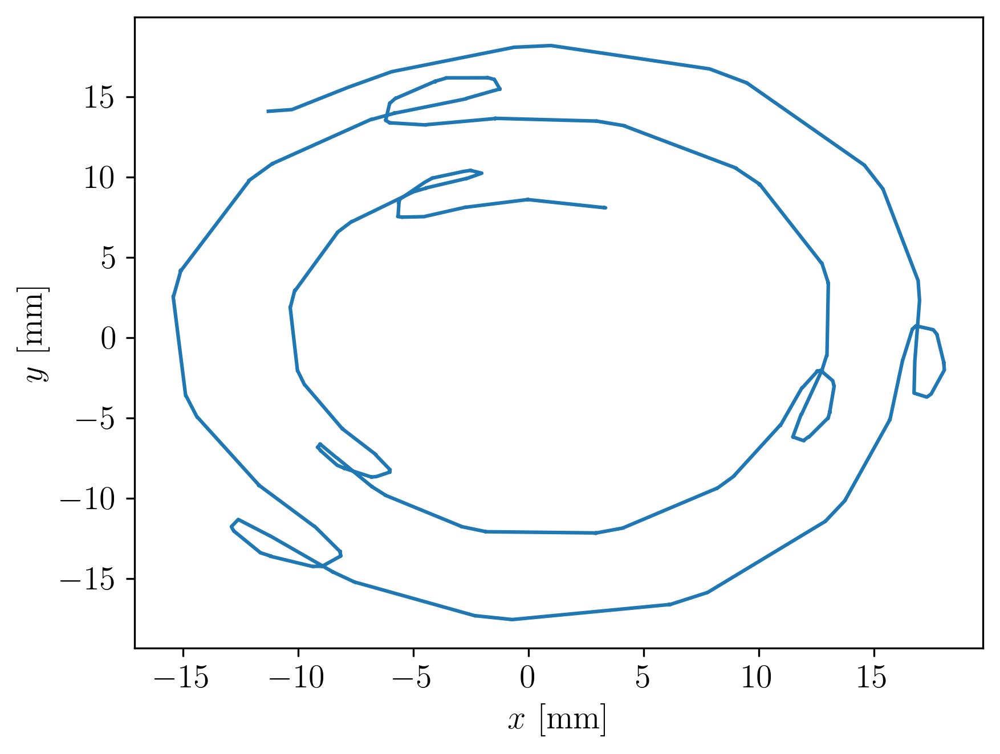

In [86]:
plt.plot(data['x'], data['y'])
plt.xlabel('$x$ [mm]')
plt.ylabel('$y$ [mm]');

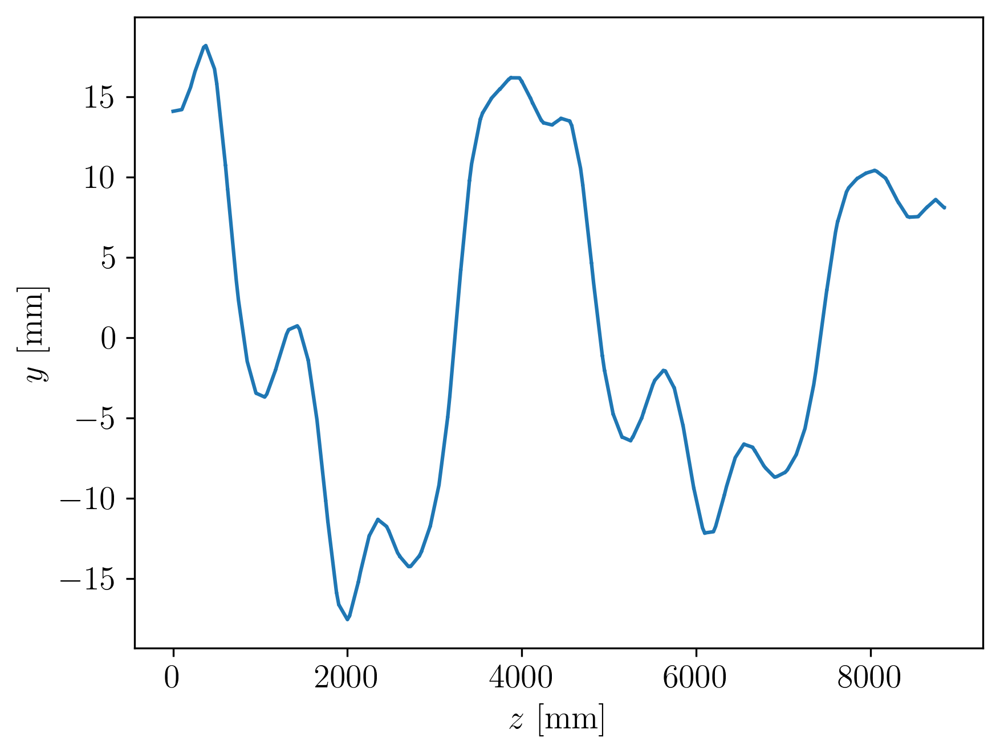

In [87]:
plt.plot(data['z'], data['y'])
plt.xlabel('$z$ [mm]')
plt.ylabel('$y$ [mm]');

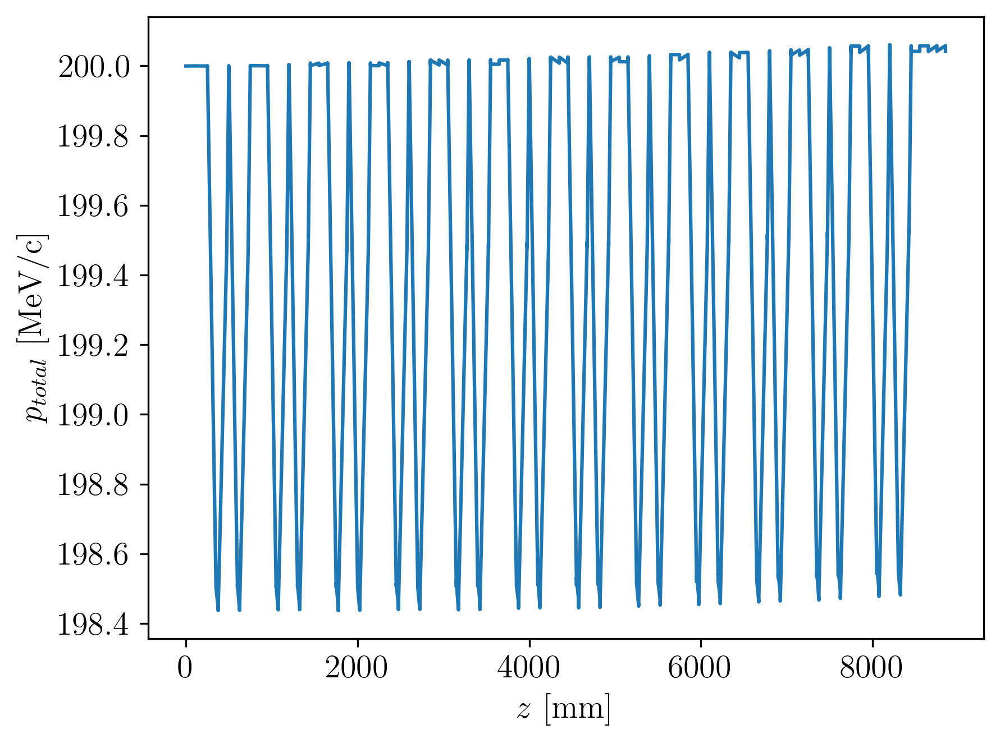

In [88]:
plt.plot(data['z'], data['ptotal'])
plt.xlabel('$z$ [mm]')
plt.ylabel('$p_{total}$ [MeV/c]');

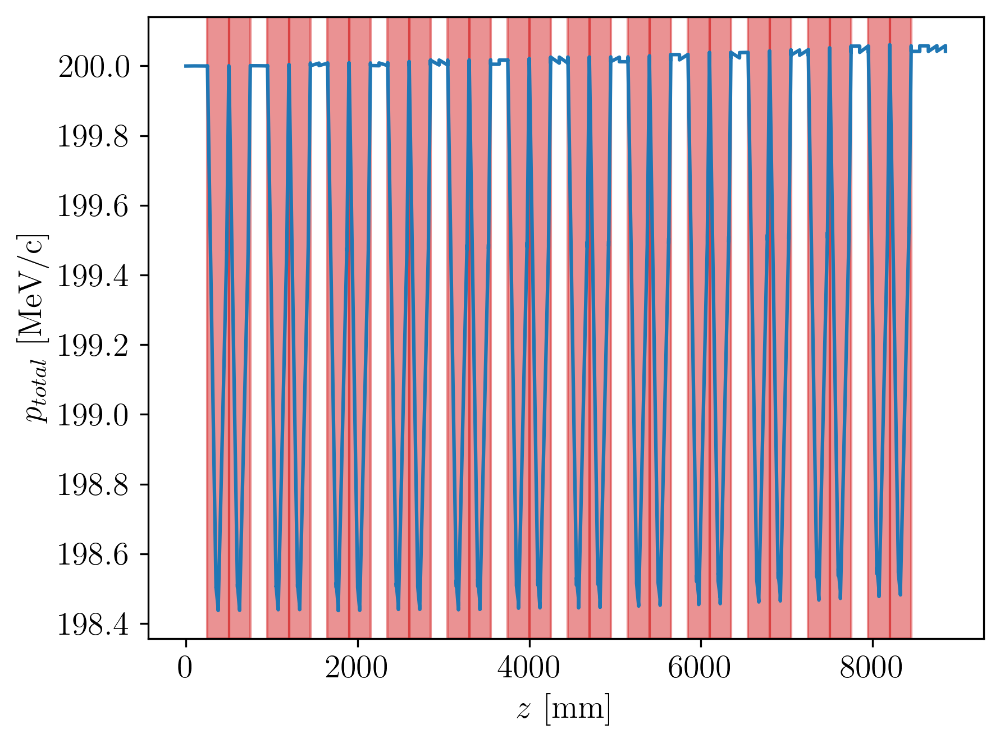

In [89]:
plt.plot(data['z'], data['ptotal'])
plt.xlabel('$z$ [mm]')
plt.ylabel('$p_{total}$ [MeV/c]')
# plt.xlim(500,4700)
rf_len = 250
space = period_len/6
for i in range(12):
    z1 = 500-rf_len/2+space*i
    z2 = 500+rf_len/2+space*i
    plt.axvspan(xmin=z1-rf_len/2,xmax=z1+rf_len/2,color='tab:red',alpha=0.5,zorder=-0.5)
    plt.axvspan(xmin=z2-rf_len/2,xmax=z2+rf_len/2,color='tab:red',alpha=0.5,zorder=-0.5)

Q: why do we see the total momentum change in the gaps between cavities? There should not be any effects that change the energy in these areas.

### w/ beam

Considering just 1 period of optics+RF for now

#### test 1

param X=-11.2945 #mm
param Y=14.0917 #mm
param Xp=0.823201/224.995 #radians
param Yp=-1.27215/224.995 #radians

beam gaussian particle=mu+ nEvents=20 \
beamZ=0.0 beamX=$X beamY=$Y beamXp=$Xp beamYp=$Yp \ 
sigmaX=0.1 sigmaY=0.1 sigmaXp=0.01 sigmaYp=0.01 \ 
meanMomentum=$p sigmaP=0.0 meanT=0.0 sigmaT=0.0

In [38]:
data_beam = readDetData('zntuple_test1.txt')

In [39]:
# for ID in np.unique(data_beam['EventID']):
#     plt.plot(data_beam[data_beam['EventID']==ID]['z'], data_beam[data_beam['EventID']==ID]['ptotal'],lw=0.5)
# plt.xlim(500,4700)
# for i in range(6):
#     z1 = 500-rf_len/2+space*i
#     z2 = 500+rf_len/2+space*i
#     plt.axvspan(xmin=z1-rf_len/2,xmax=z1+rf_len/2,color='tab:red',alpha=0.5,zorder=-0.5)
#     plt.axvspan(xmin=z2-rf_len/2,xmax=z2+rf_len/2,color='tab:red',alpha=0.5,zorder=-0.5)

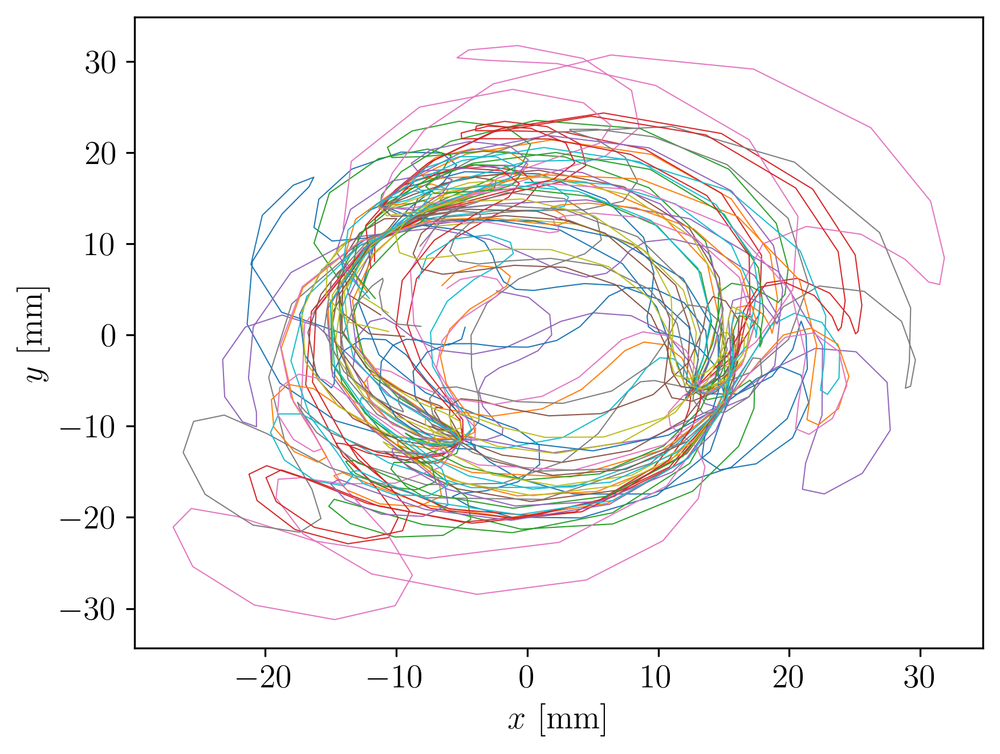

In [70]:
for ID in np.unique(data_beam['EventID']):
    plt.plot(data_beam[data_beam['EventID']==ID]['x'], data_beam[data_beam['EventID']==ID]['y'],lw=0.5)
    plt.xlabel('$x$ [mm]')
    plt.ylabel('$y$ [mm]')

/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/2756076845.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam[data_beam['EventID']==ID][data_beam['z']==0]['x'], data_beam[data_beam['EventID']==ID][data_beam['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/2756076845.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam[data_beam['EventID']==ID][data_beam['z']==0]['x'], data_beam[data_beam['EventID']==ID][data_beam['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/2756076845.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam[data_beam['EventID']==ID][data_beam['z']==0]['x'], data_beam[data_beam['EventID']==ID][data_beam['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/27

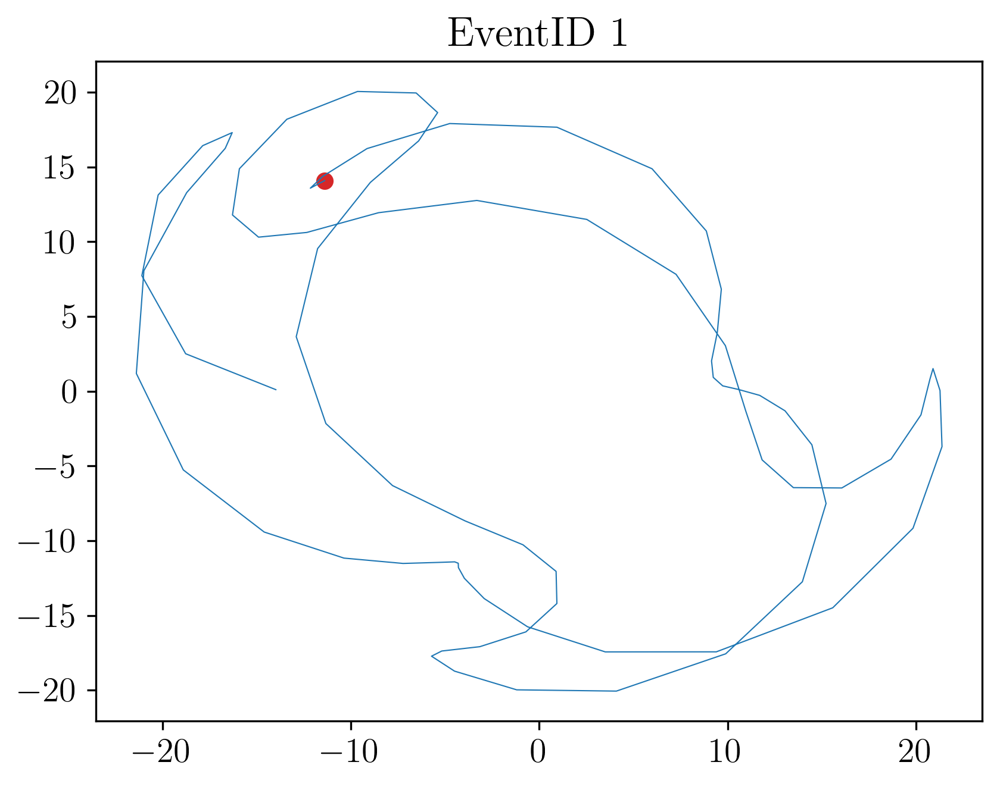

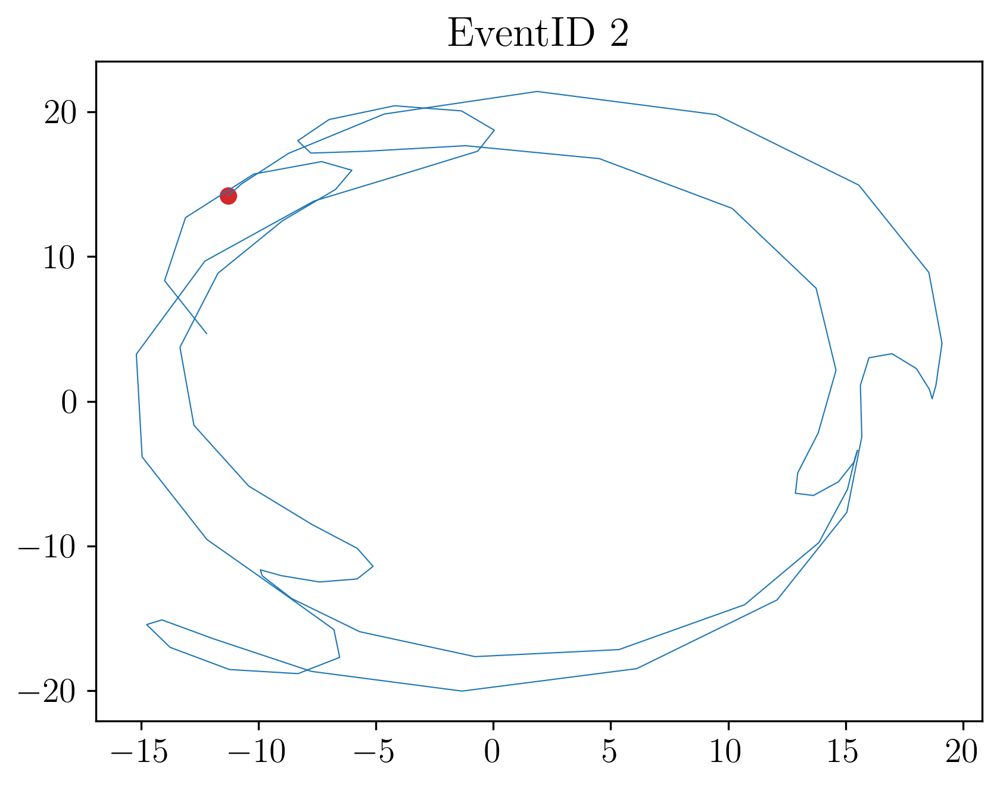

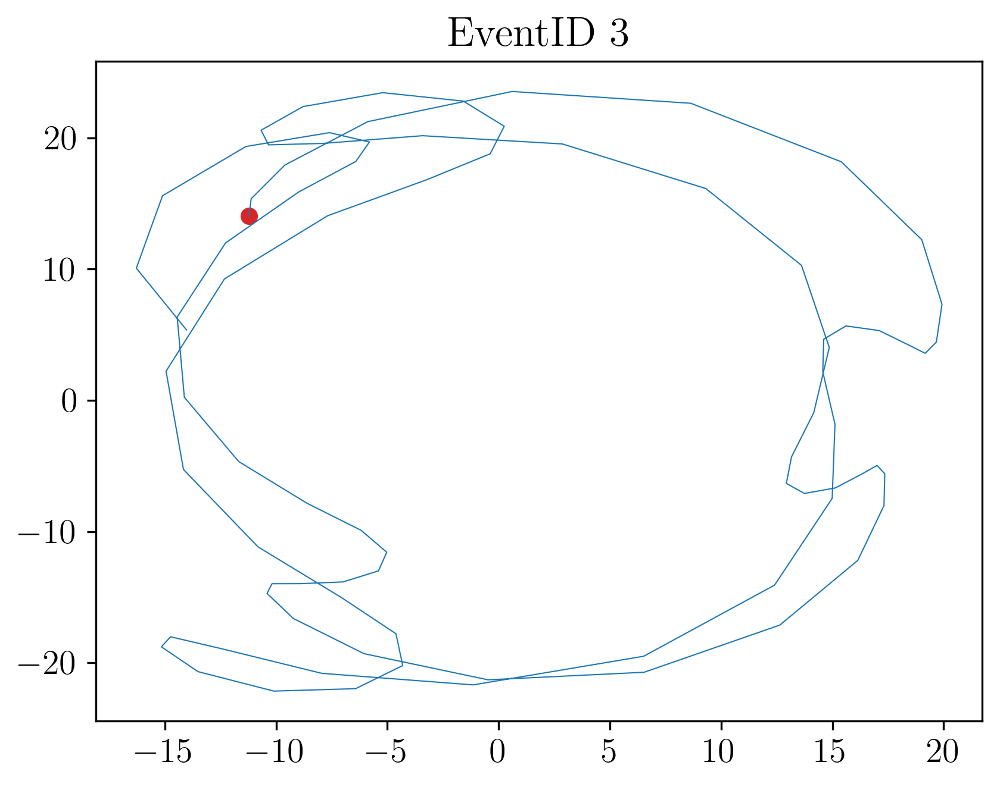

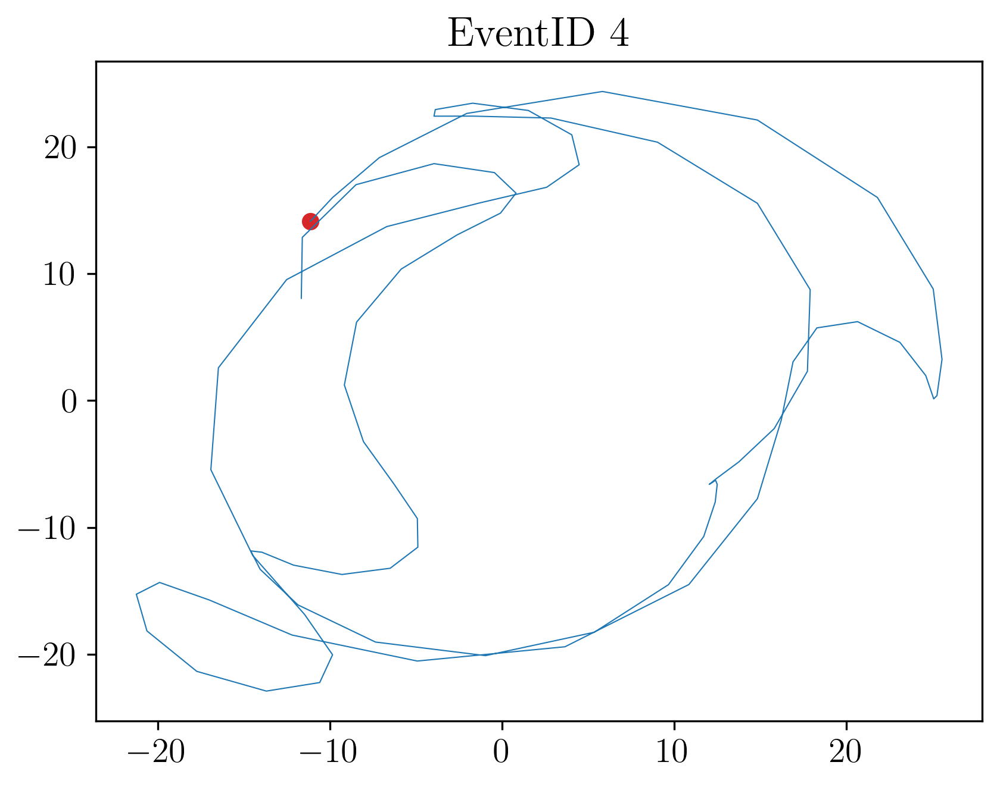

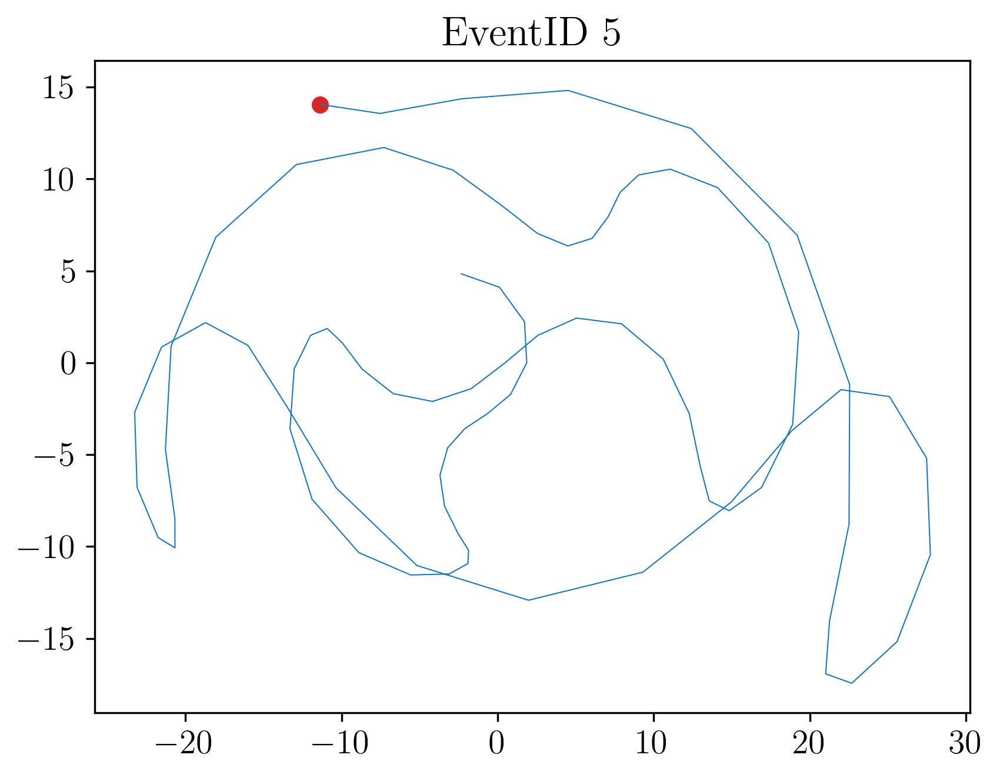

...

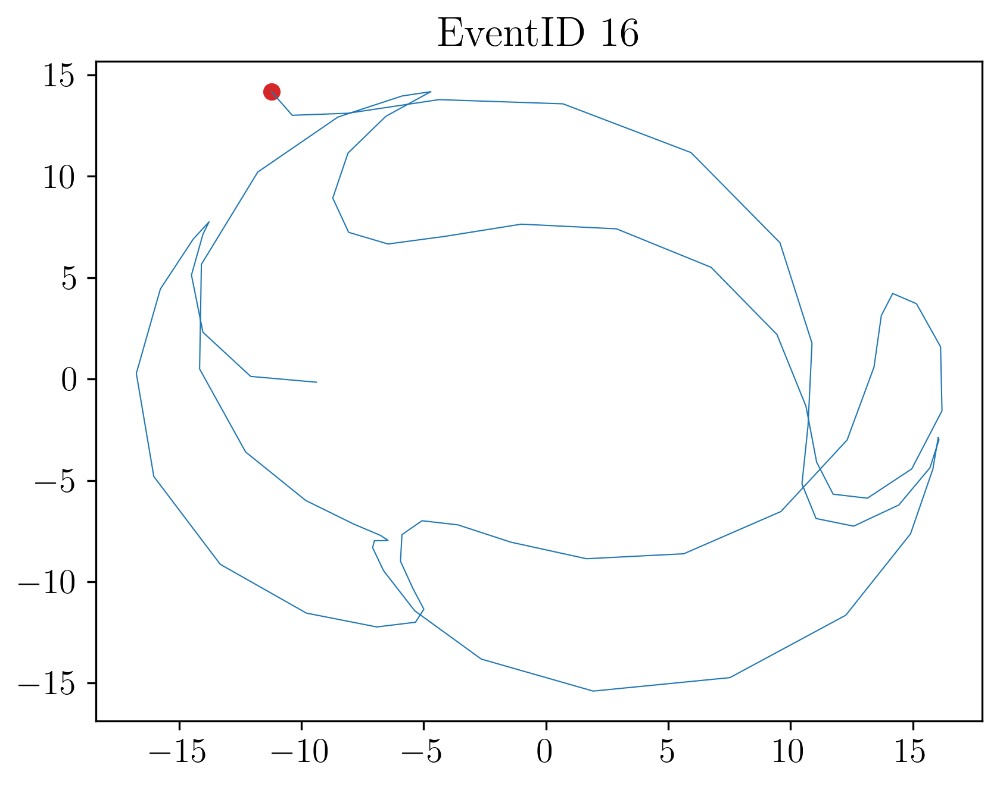

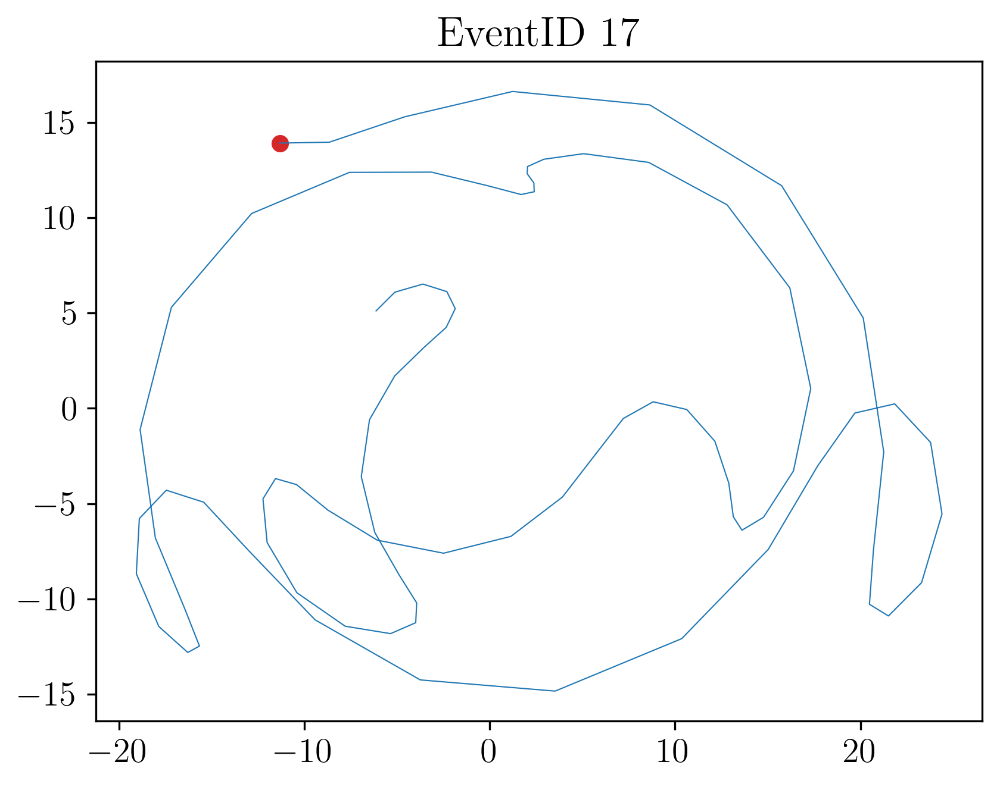

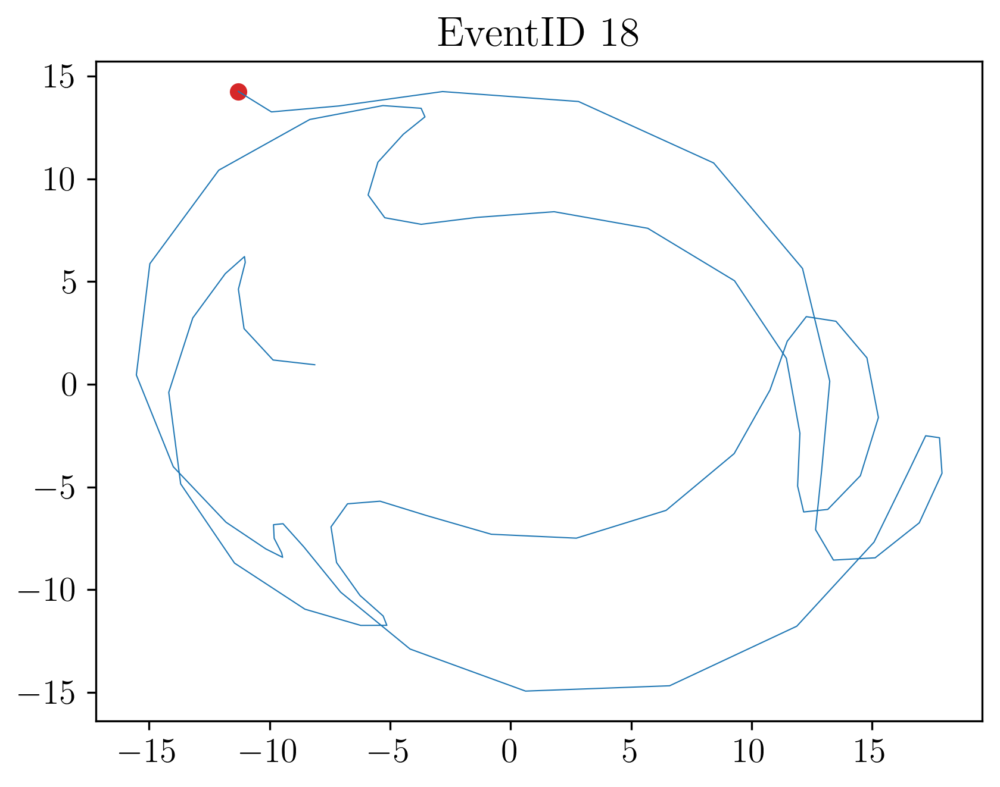

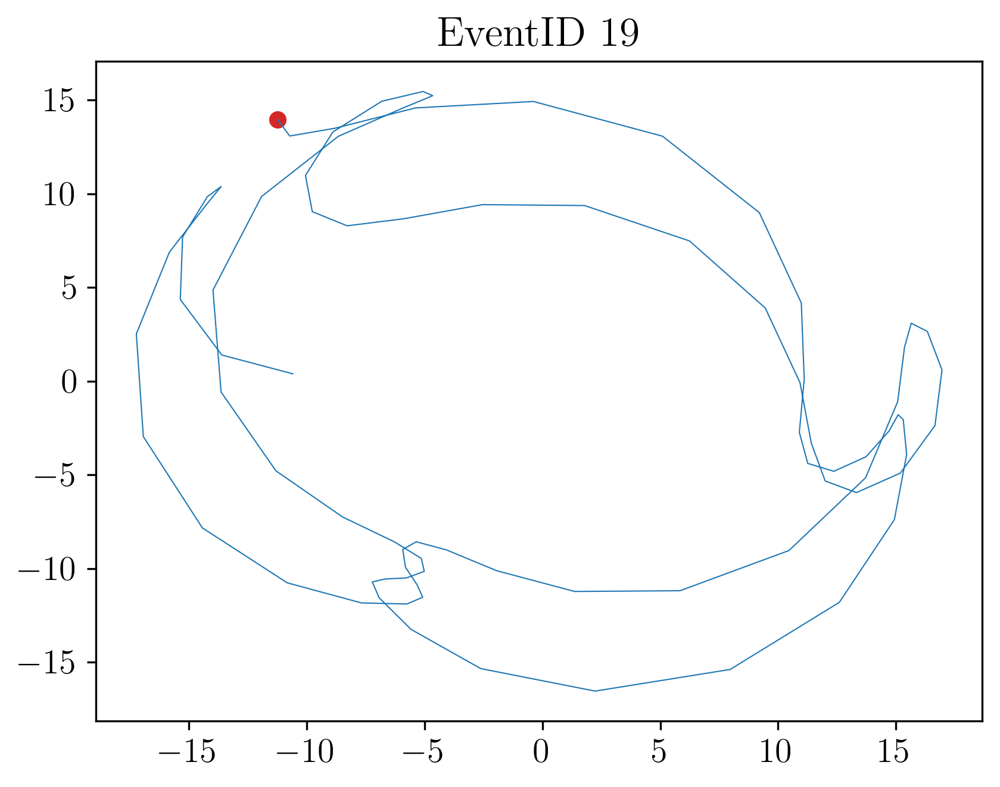

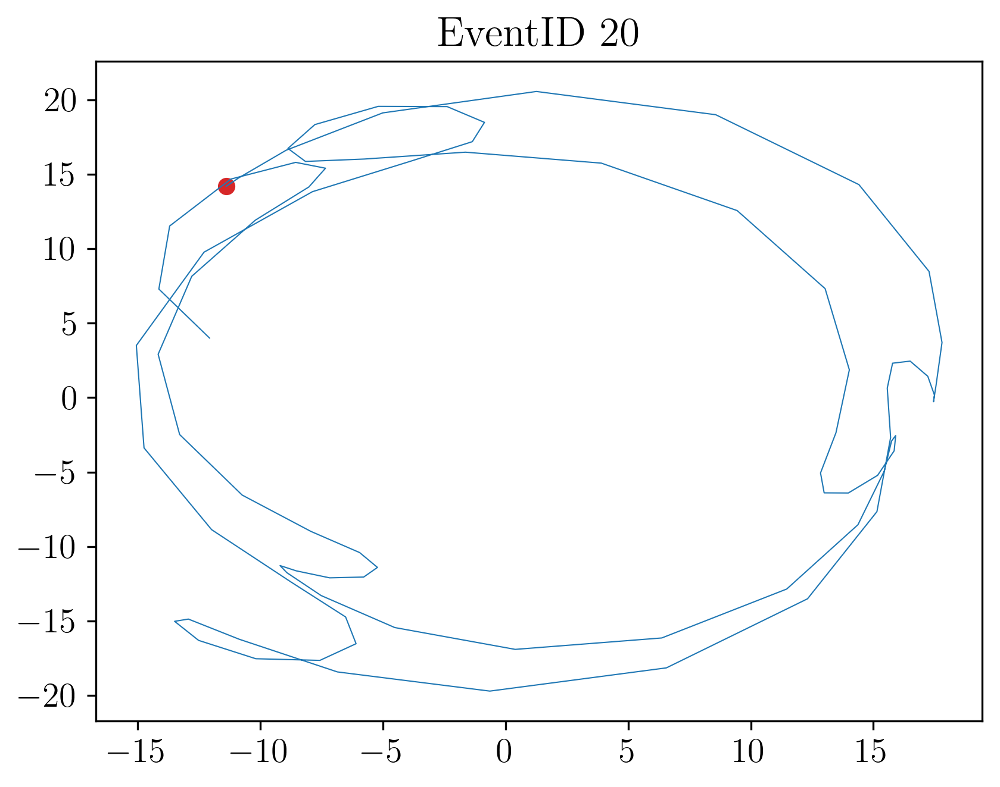

In [41]:
for ID in np.unique(data_beam['EventID']):
    plt.figure()
    plt.plot(data_beam[data_beam['EventID']==ID]['x'], data_beam[data_beam['EventID']==ID]['y'],lw=0.5)
    plt.scatter(data_beam[data_beam['EventID']==ID][data_beam['z']==0]['x'], data_beam[data_beam['EventID']==ID][data_beam['z']==0]['y'],color='tab:red');
    plt.title(f'EventID {int(ID)}')

In [42]:
init = data_beam[data_beam['EventID']==20][data_beam['z']==0];
print(f"x : {init['x'].values}")
print(f"y : {init['y'].values}")
print(f"xp : {init['xp'].values}")
print(f"yp : {init['yp'].values}")

x : [-11.3813]
y : [14.1893]
xp : [-0.00103593]
yp : [-0.00054428]


/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/507363380.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  init = data_beam[data_beam['EventID']==20][data_beam['z']==0];


#### test 2

param testX=-11.3813
param testY=14.1893
param testXp=-0.00103593
param testYp=-0.00054428

beam gaussian particle=mu+ nEvents=20 \
beamZ=0.0 beamX=$testX beamY=$testY beamXp=$testXp beamYp=$testYp \ 
sigmaX=1.0 sigmaY=1.0 sigmaXp=0.0 sigmaYp=0.0 \ 
meanMomentum=$p sigmaP=0.0 meanT=0.0 sigmaT=0.0

In [43]:
data_beam2 = readDetData('zntuple_test2.txt')

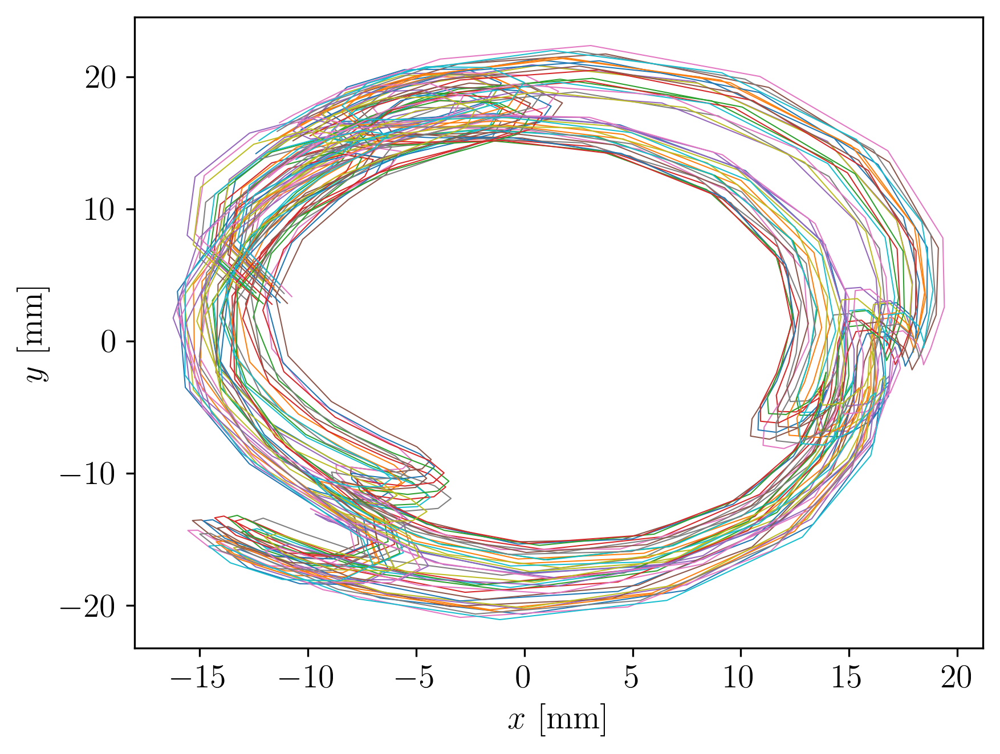

In [71]:
for ID in np.unique(data_beam2['EventID']):
    plt.plot(data_beam2[data_beam2['EventID']==ID]['x'], data_beam2[data_beam2['EventID']==ID]['y'],lw=0.5)
    plt.xlabel('$x$ [mm]')
    plt.ylabel('$y$ [mm]')

/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/1912980837.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['x'], data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/1912980837.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['x'], data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/1912980837.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['x'], data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/

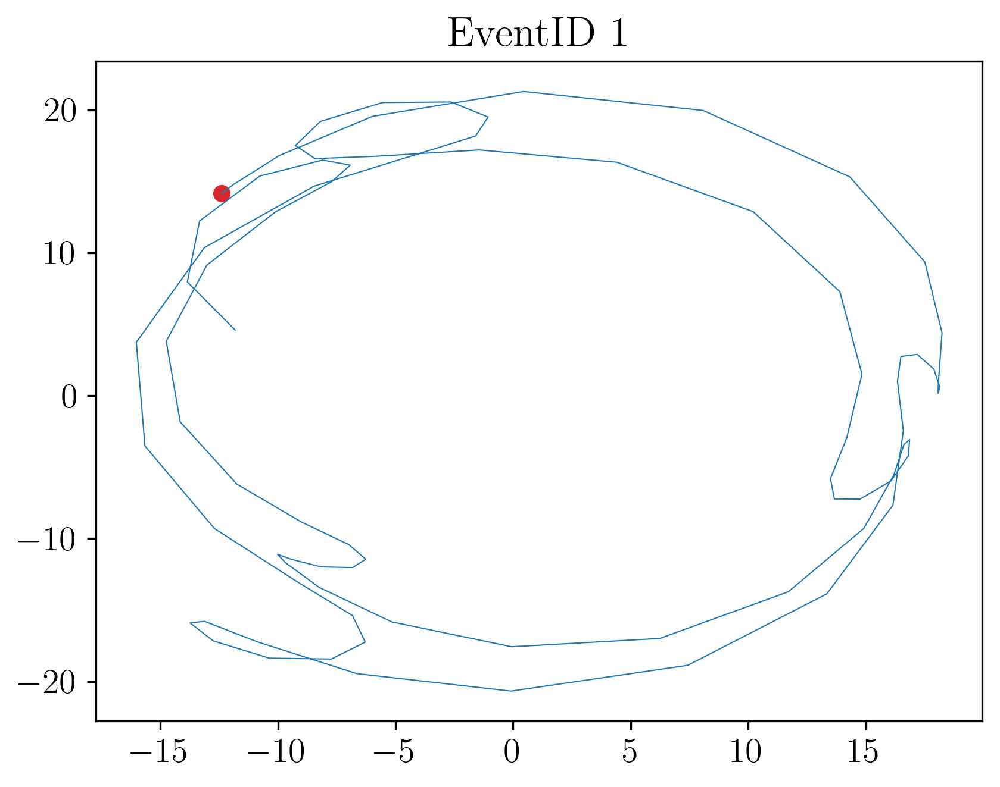

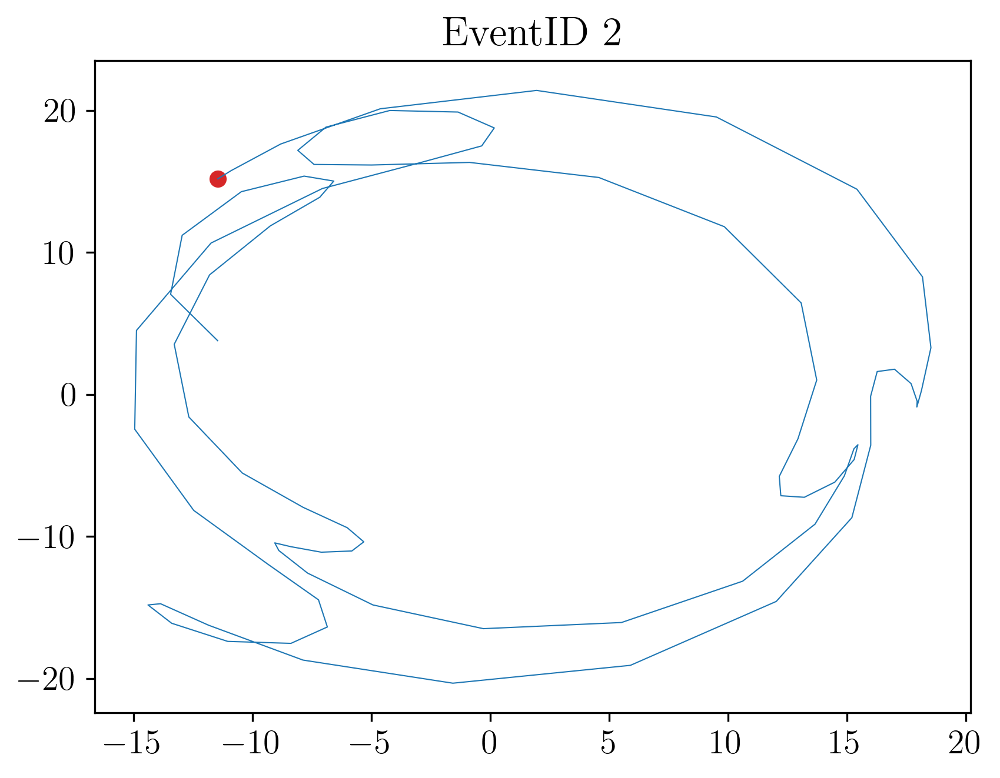

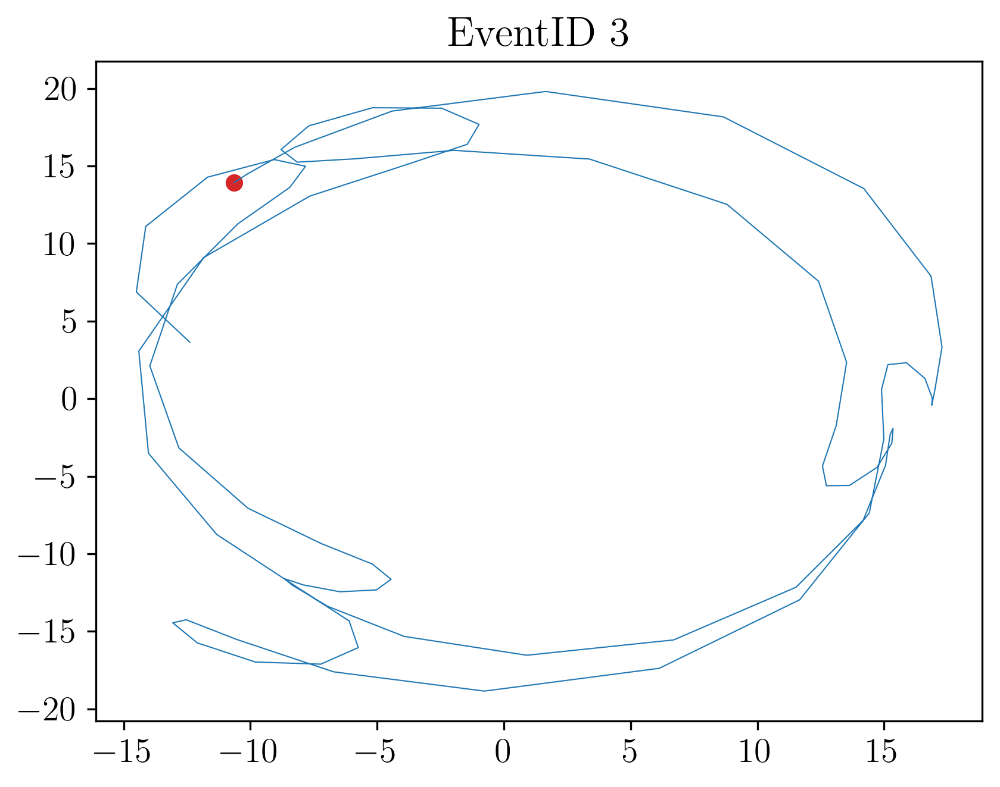

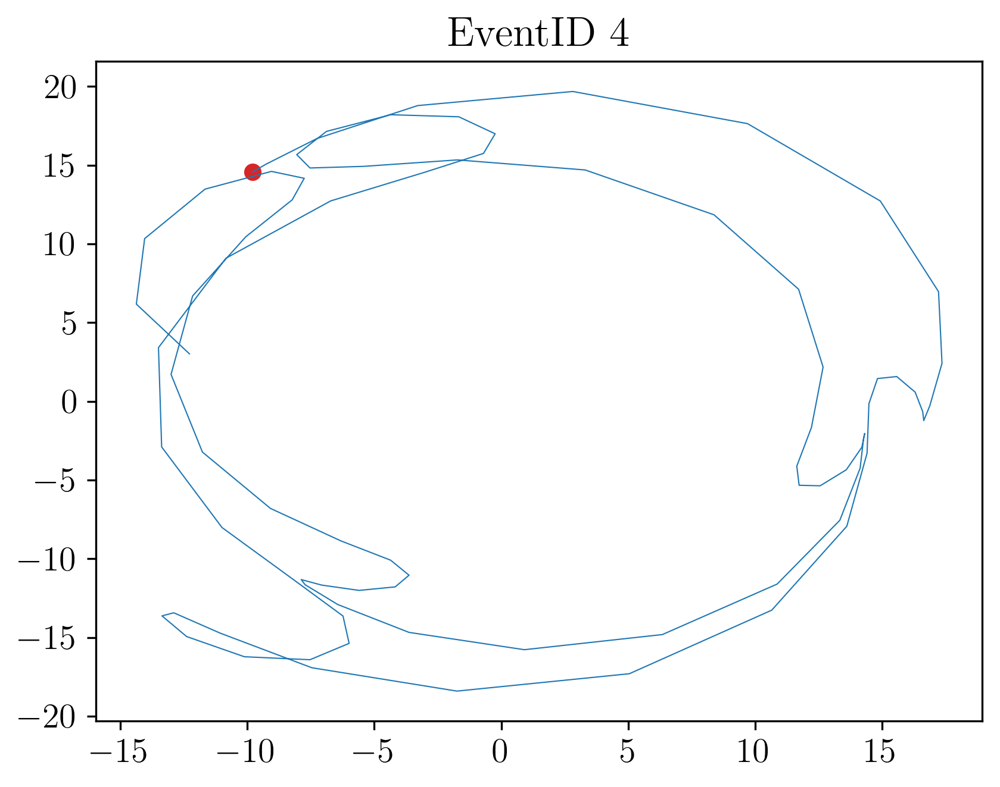

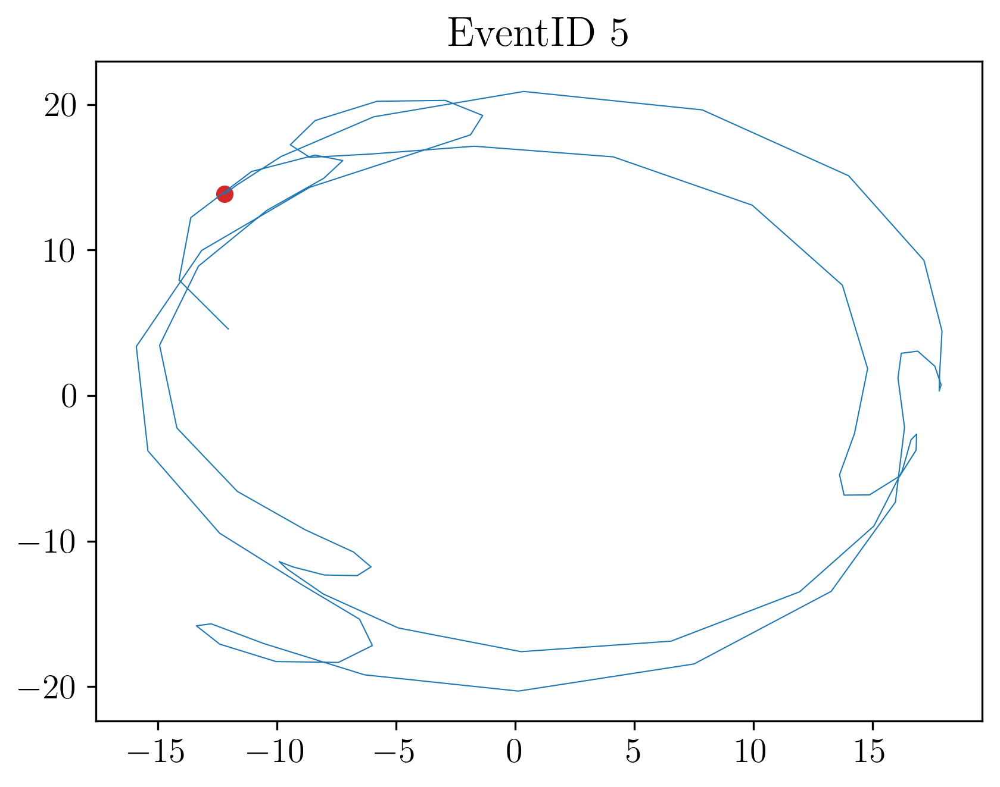

...

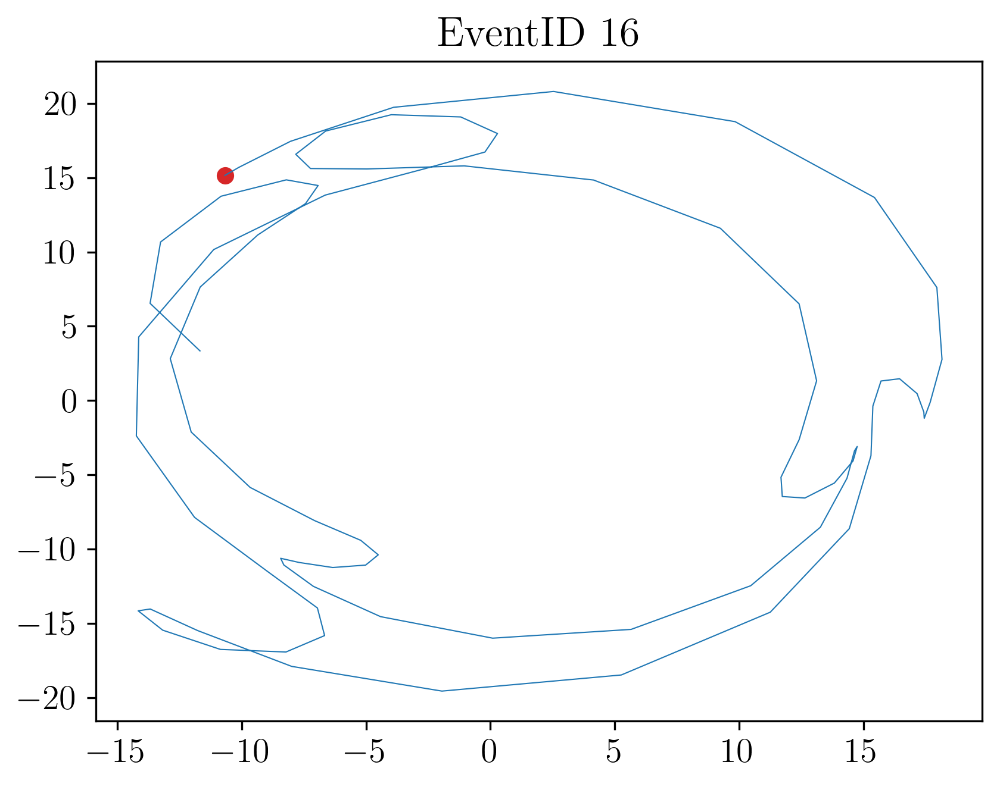

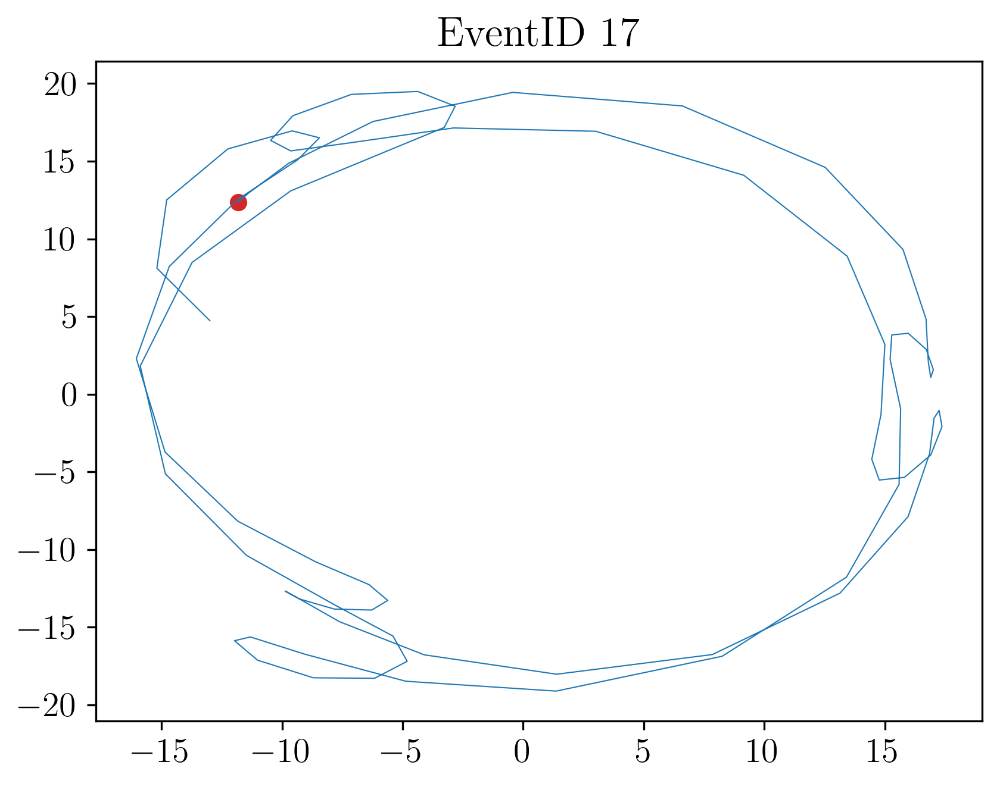

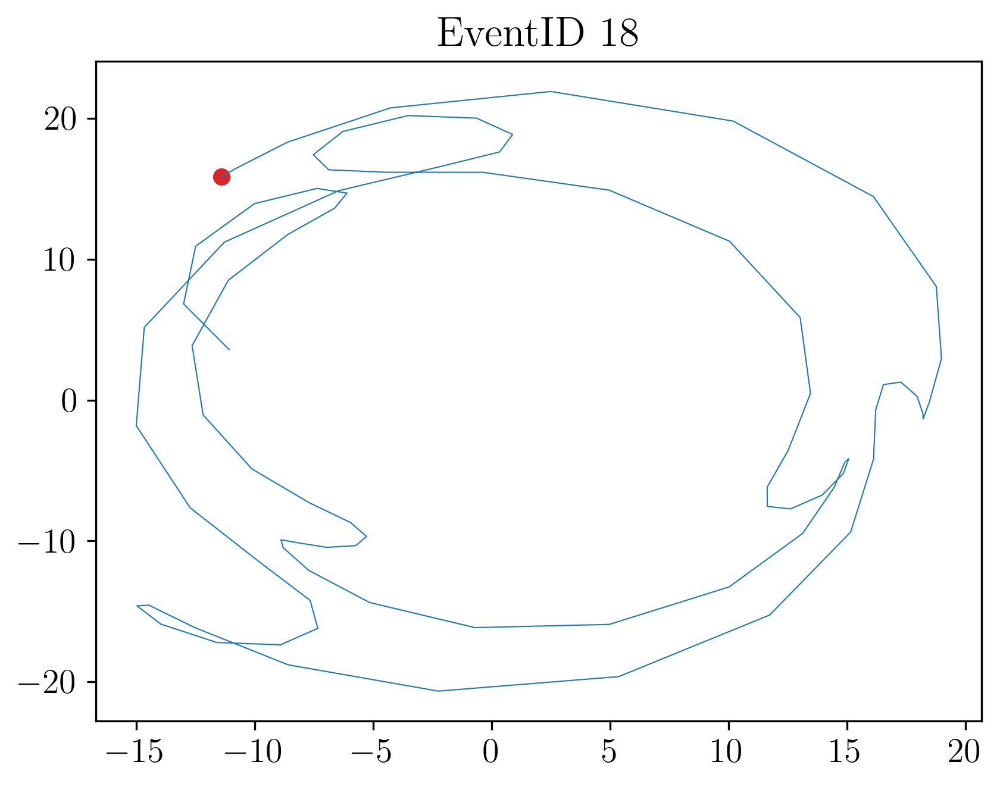

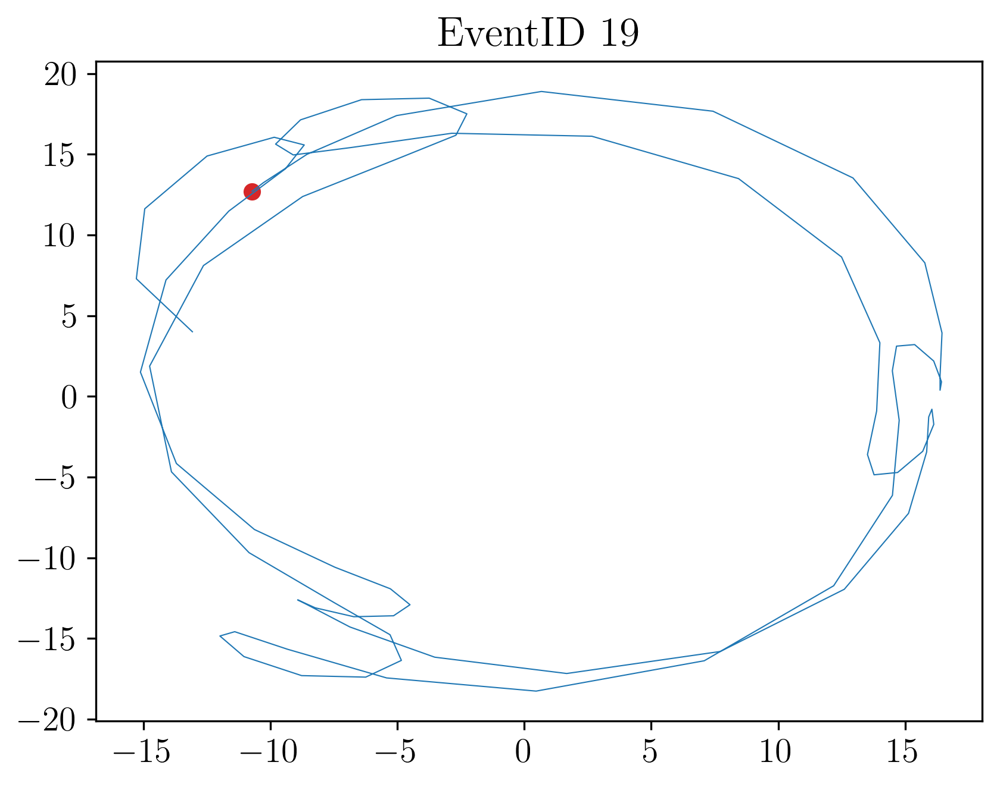

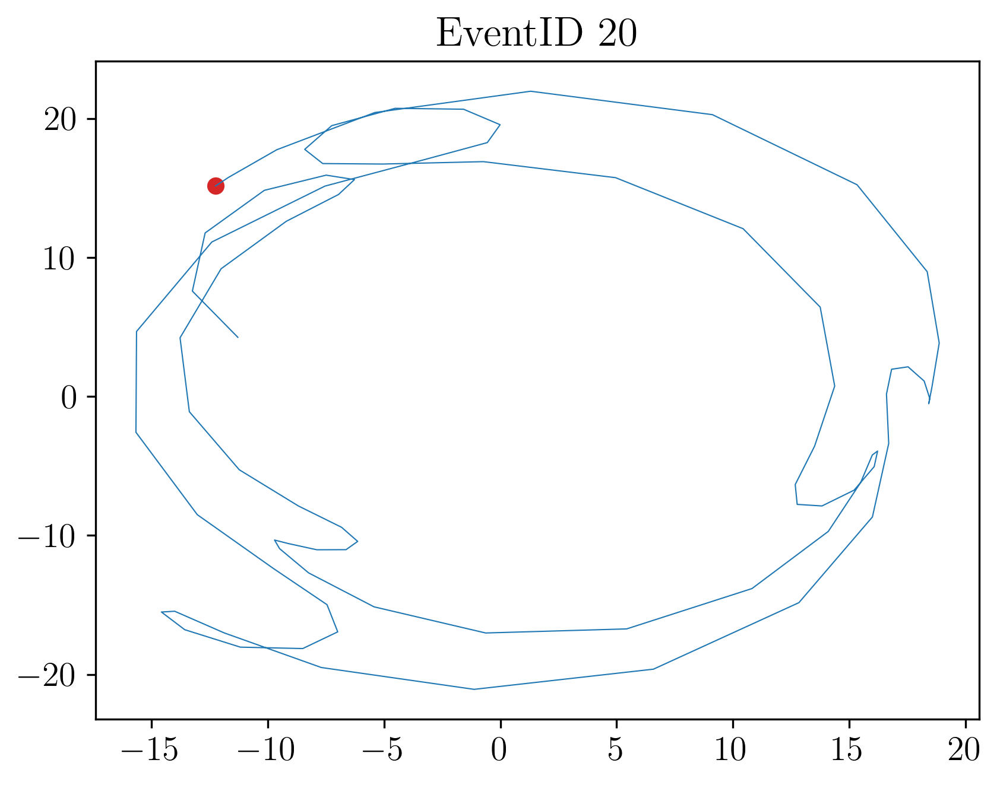

In [45]:
for ID in np.unique(data_beam2['EventID']):
    plt.figure()
    plt.plot(data_beam2[data_beam2['EventID']==ID]['x'], data_beam2[data_beam2['EventID']==ID]['y'],lw=0.5)
    plt.scatter(data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['x'], data_beam2[data_beam2['EventID']==ID][data_beam2['z']==0]['y'],color='tab:red');
    plt.title(f'EventID {int(ID)}')

In [49]:
init2 = data_beam2[data_beam2['EventID']==17][data_beam2['z']==0];
print(f"x : {init2['x'].values}")
print(f"y : {init2['y'].values}")
print(f"xp : {init2['xp'].values}")
print(f"yp : {init2['yp'].values}")

x : [-11.8083]
y : [12.3683]
xp : [-0.00103593]
yp : [-0.00054428]


/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/1546450868.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  init2 = data_beam2[data_beam2['EventID']==17][data_beam2['z']==0];


#### test 3

param testX=-11.8083
param testY=12.3683
param testXp=-0.00103593
param testYp=-0.00054428

beam gaussian particle=mu+ nEvents=20 \
beamZ=0.0 beamX=$testX beamY=$testY beamXp=$testXp beamYp=$testYp \ 
sigmaX=0.0 sigmaY=0.0 sigmaXp=0.002 sigmaYp=0.002 \ 
meanMomentum=$p sigmaP=0.0 meanT=0.0 sigmaT=0.0

In [ ]:
data_beam3 = readDetData('zntuple_test3.txt')

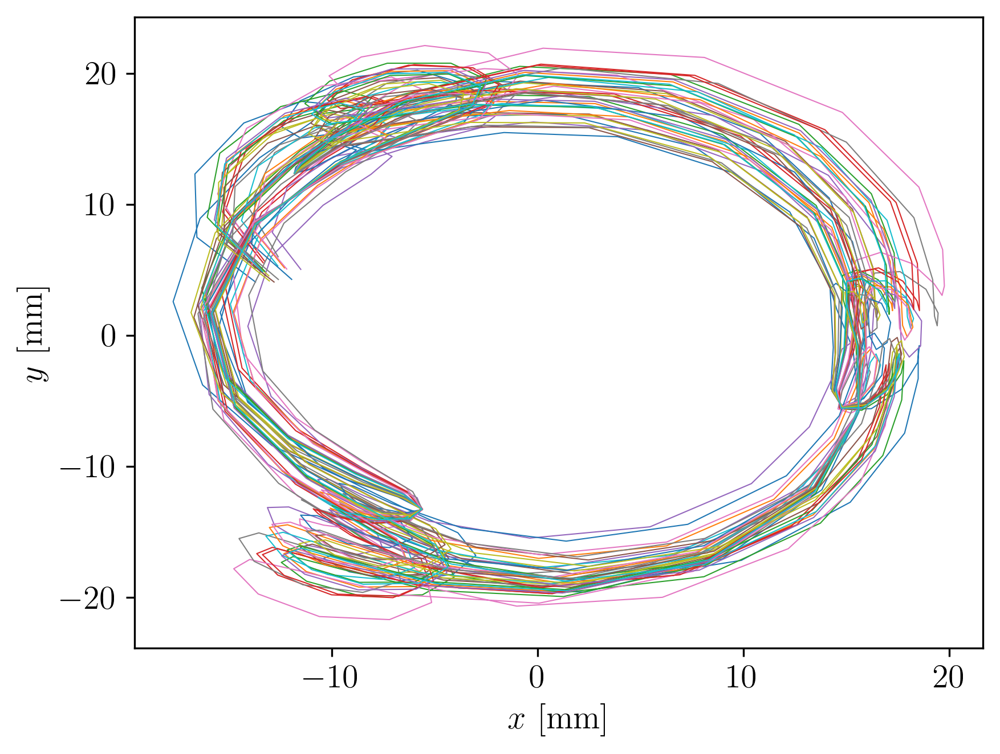

In [72]:
for ID in np.unique(data_beam3['EventID']):
    plt.plot(data_beam3[data_beam3['EventID']==ID]['x'], data_beam3[data_beam3['EventID']==ID]['y'],lw=0.5)
    plt.xlabel('$x$ [mm]')
    plt.ylabel('$y$ [mm]')

/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/3426815568.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['x'], data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/3426815568.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['x'], data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/3426815568.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['x'], data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['y'],color='tab:red');
/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/

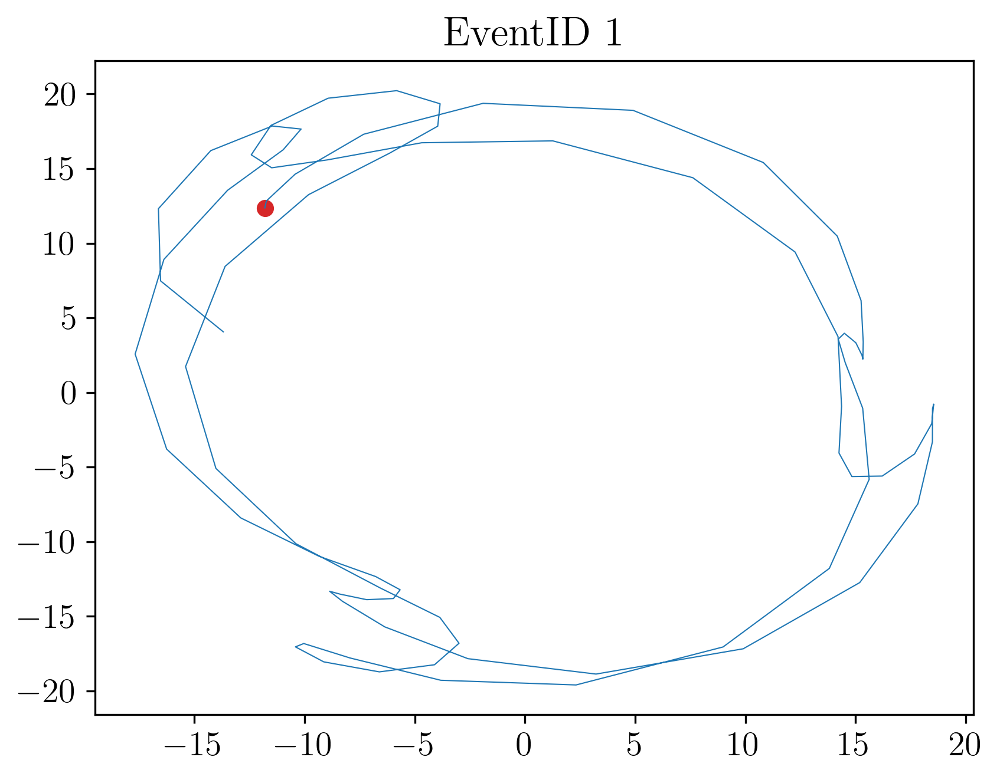

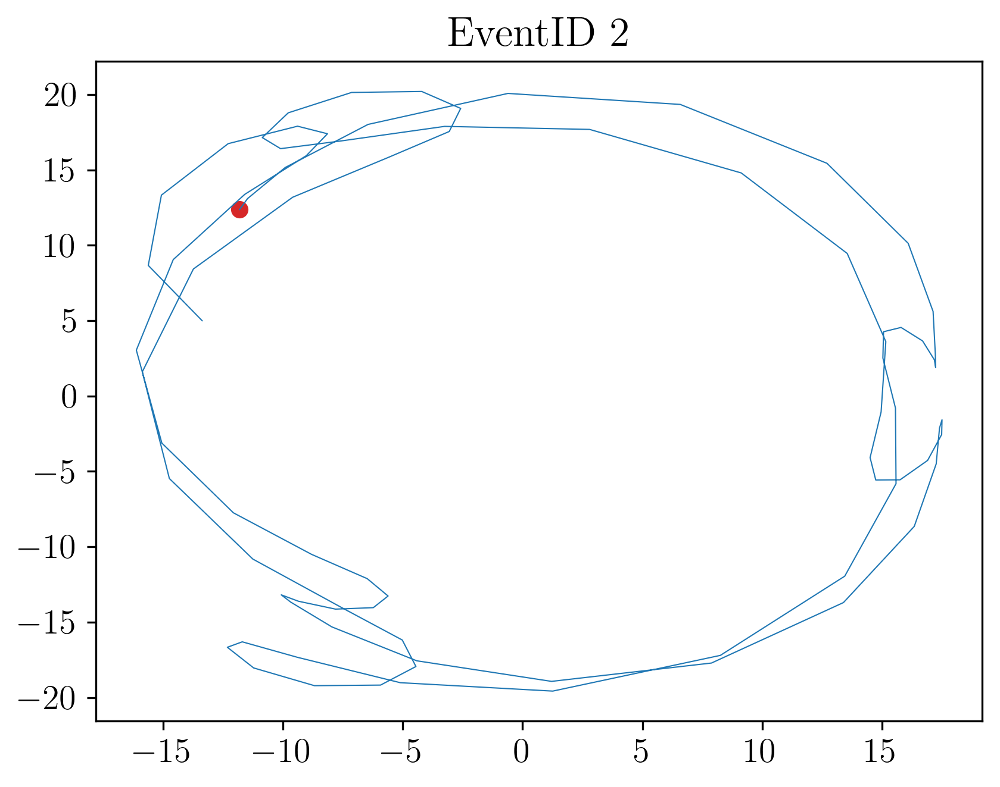

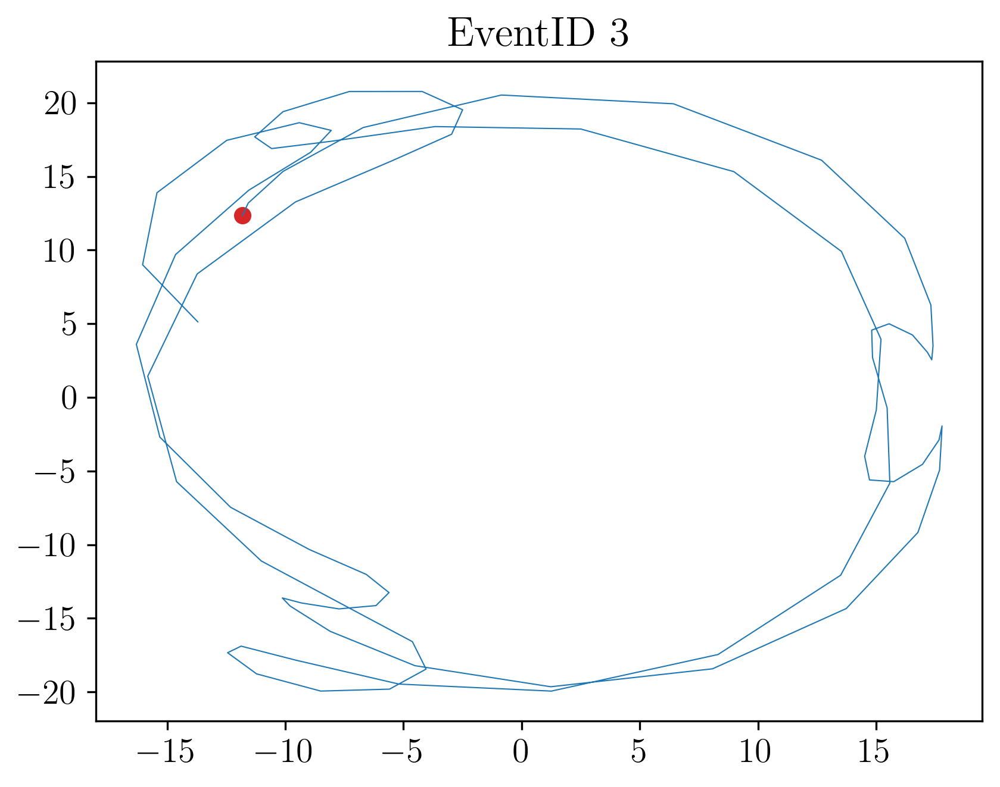

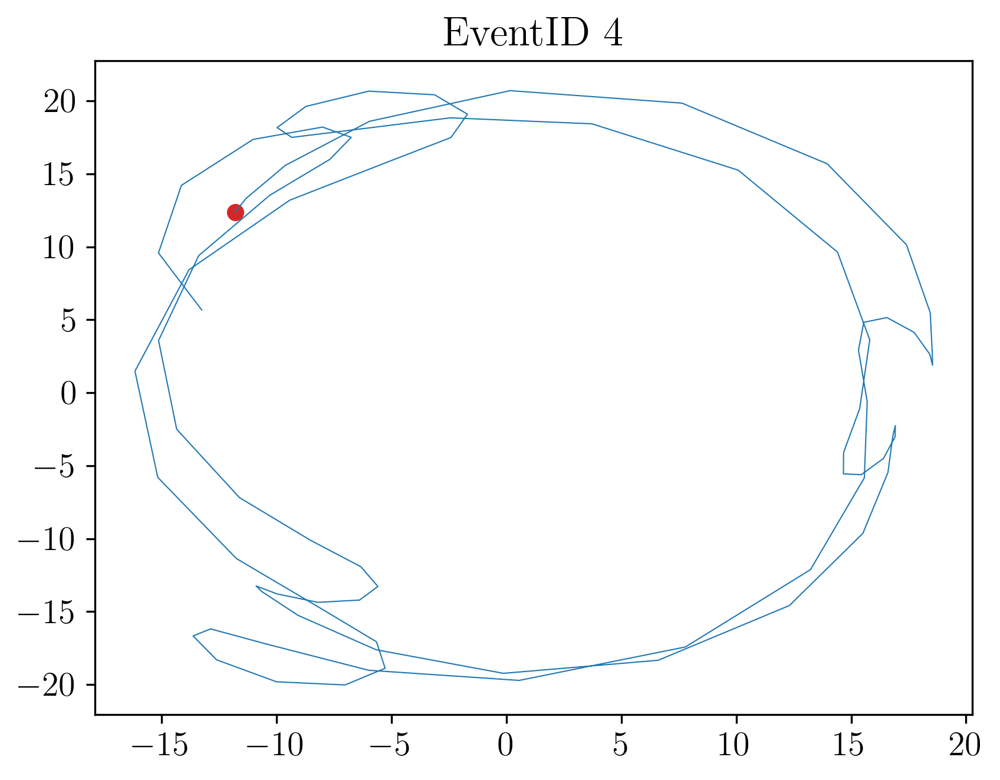

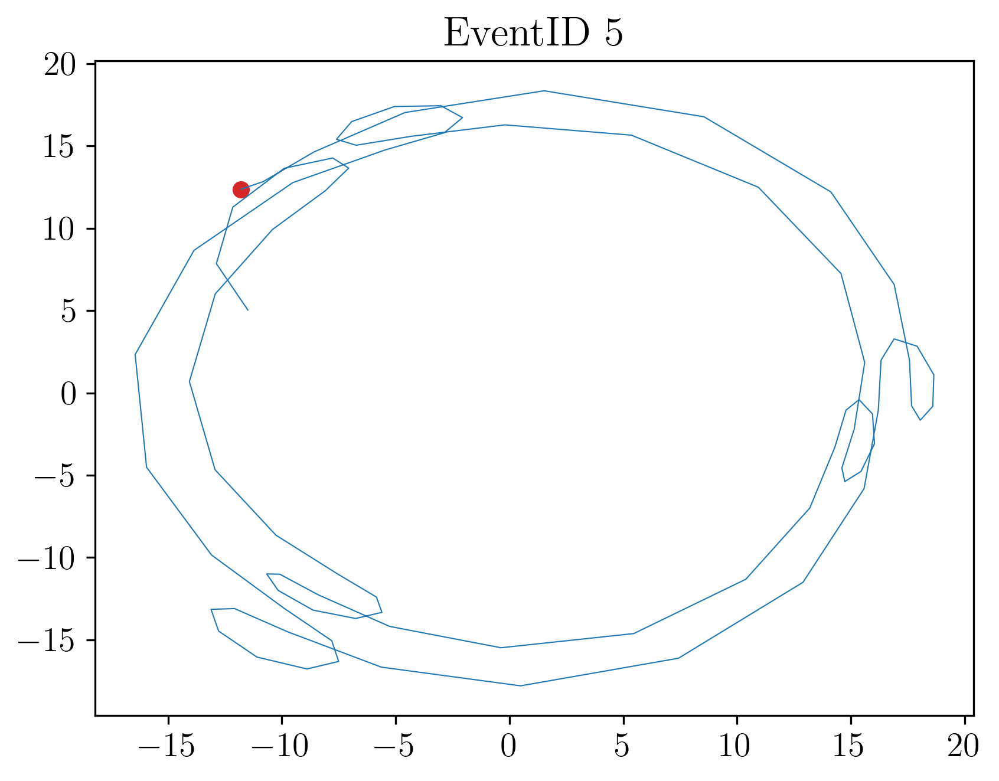

...

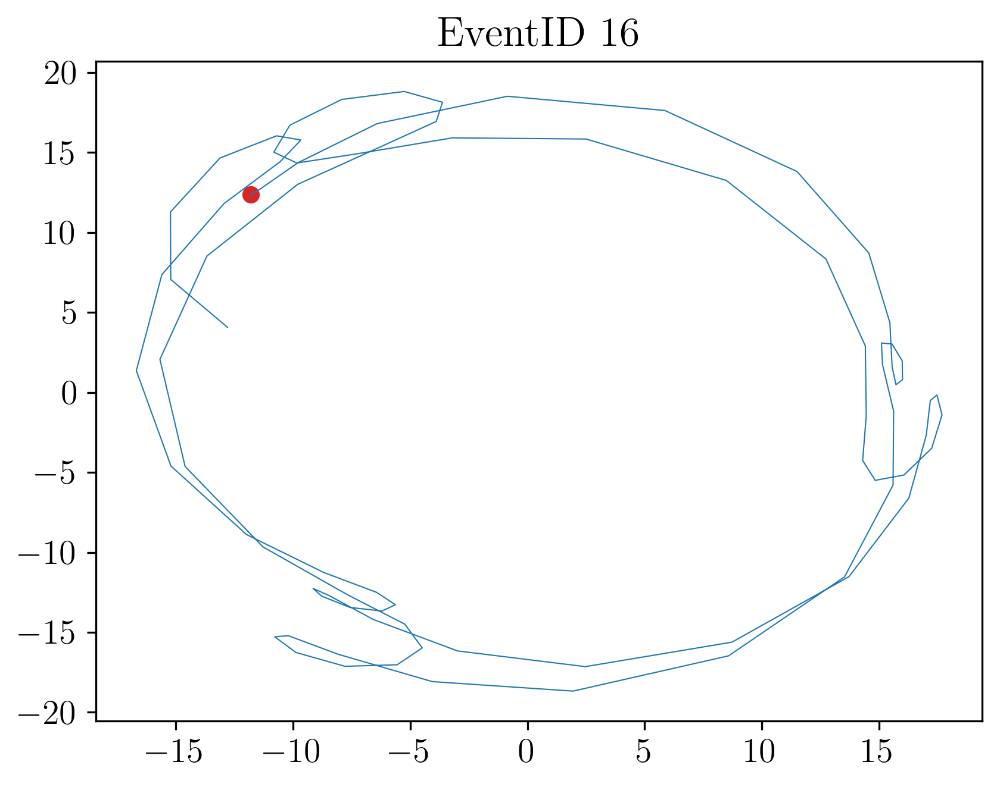

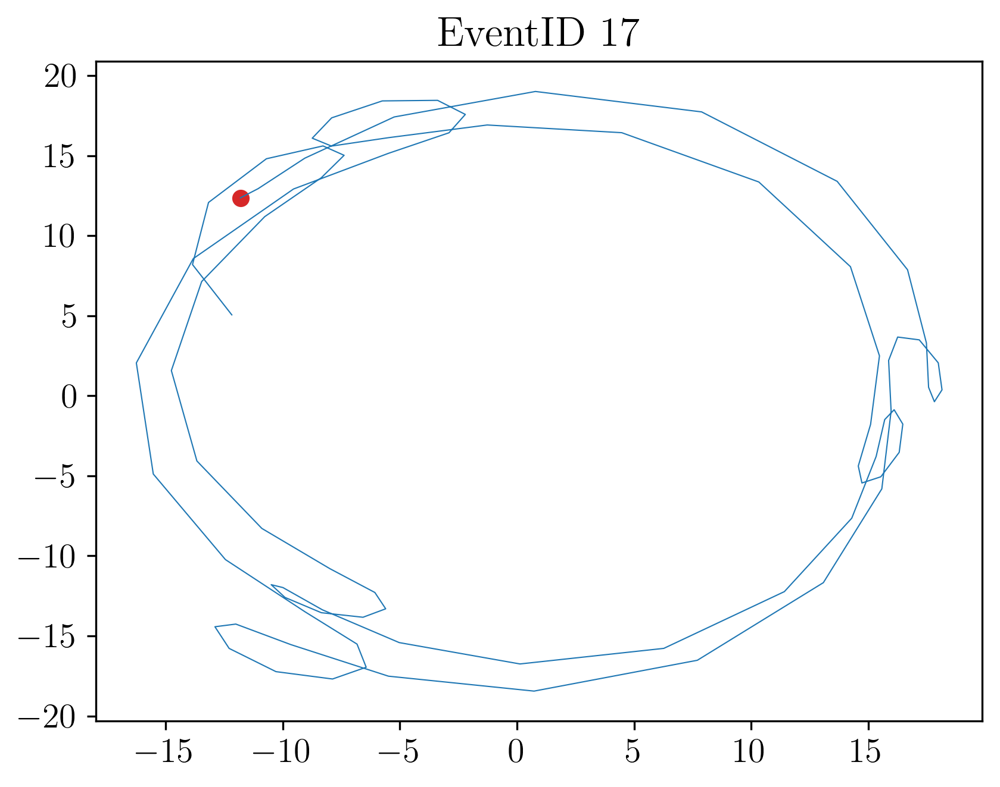

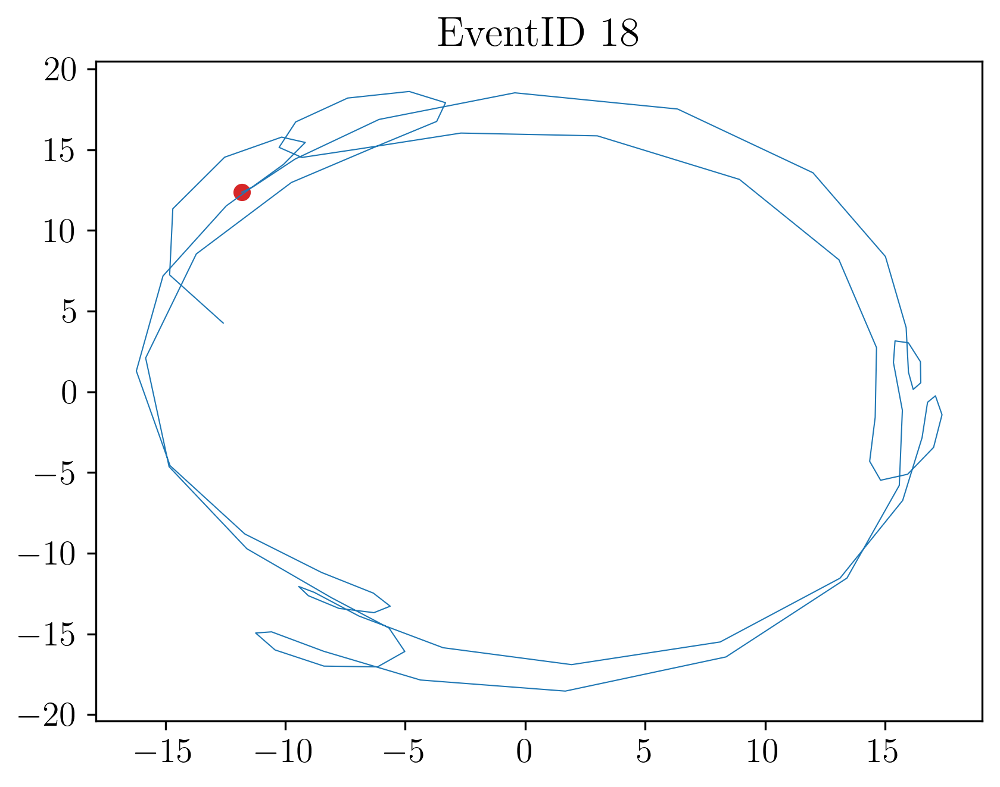

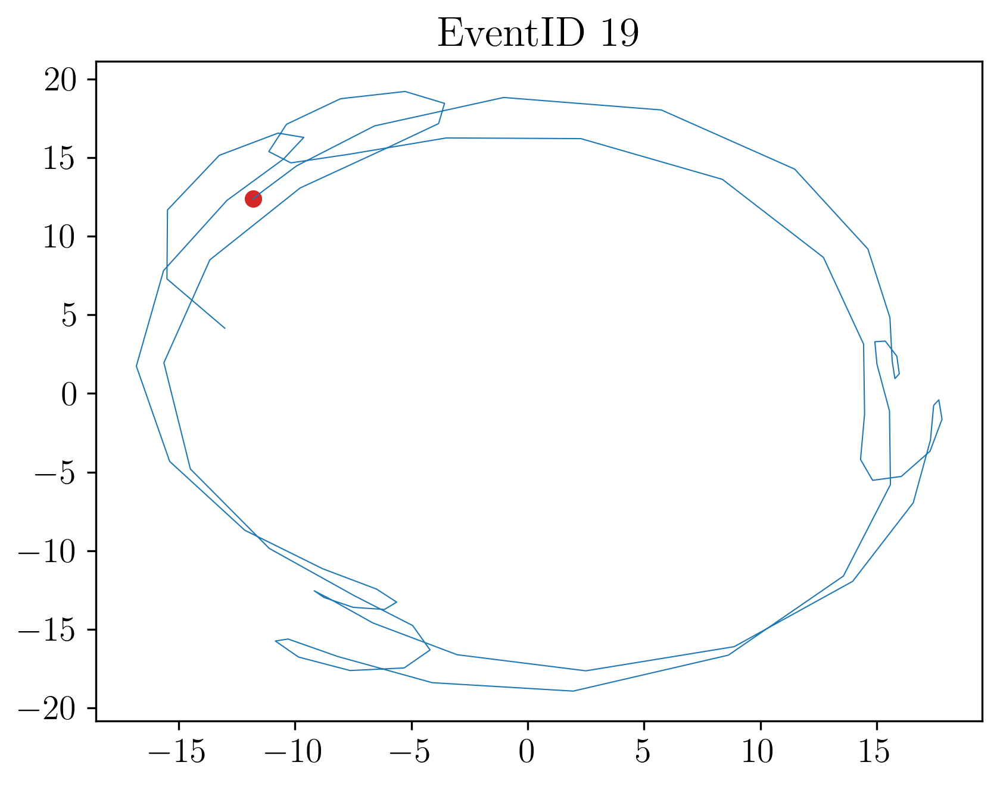

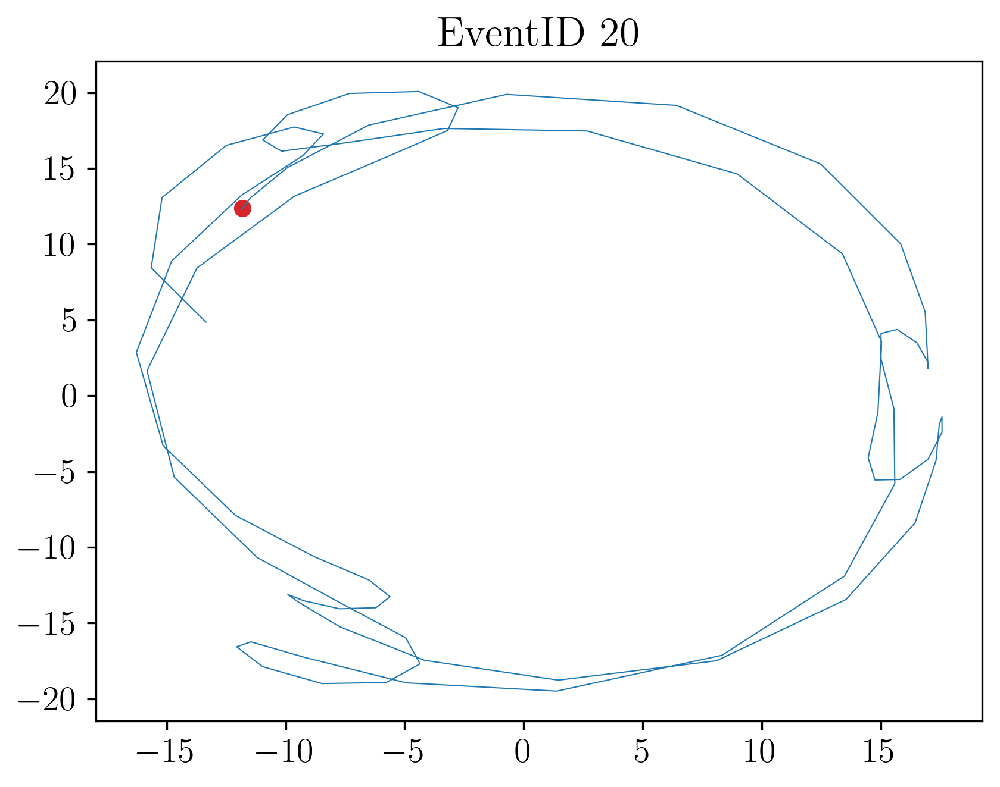

In [54]:
for ID in np.unique(data_beam3['EventID']):
    plt.figure()
    plt.plot(data_beam3[data_beam3['EventID']==ID]['x'], data_beam3[data_beam3['EventID']==ID]['y'],lw=0.5)
    plt.scatter(data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['x'], data_beam3[data_beam3['EventID']==ID][data_beam3['z']==0]['y'],color='tab:red');
    plt.title(f'EventID {int(ID)}')

In [55]:
init3 = data_beam3[data_beam3['EventID']==11][data_beam3['z']==0];
print(f"x : {init3['x'].values}")
print(f"y : {init3['y'].values}")
print(f"xp : {init3['xp'].values}")
print(f"yp : {init3['yp'].values}")

x : [-11.8083]
y : [12.3683]
xp : [0.00156793]
yp : [-0.00396514]


/var/folders/d1/72_2xzds6lz0krc7zdw_94_m0000gp/T/ipykernel_13788/242701996.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  init3 = data_beam3[data_beam3['EventID']==11][data_beam3['z']==0];
